In [27]:
import pandas as pd
import numpy as np

weather = pd.read_csv("SF_Weather.csv", index_col="DATE")


In [28]:
weather


,STATION,NAME,ACMH,ACSH,AWND,FMTM,FRGT,PGTM,PRCP,PSUN,...,WT11,WT13,WT14,WT16,WT18,WT21,WT22,WV01,WV03,WV20
DATE,,,,,,,,,,,,,,,,,,,,,
1960-01-01,USW00023188,"SAN DIEGO INTERNATIONAL AIRPORT, CA US",NaN,NaN,NaN,NaN,NaN,NaN,0.03,NaN,...,NaN,NaN,NaN,1.0,NaN,NaN,NaN,NaN,NaN,NaN
1960-01-02,USW00023188,"SAN DIEGO INTERNATIONAL AIRPORT, CA US",NaN,NaN,NaN,NaN,NaN,NaN,0.00,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1960-01-03,USW00023188,"SAN DIEGO INTERNATIONAL AIRPORT, CA US",NaN,NaN,NaN,NaN,NaN,NaN,0.00,NaN,...,NaN,NaN,NaN,1.0,NaN,NaN,NaN,NaN,NaN,NaN
1960-01-04,USW00023188,"SAN DIEGO INTERNATIONAL AIRPORT, CA US",NaN,NaN,NaN,NaN,NaN,NaN,0.00,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1960-01-05,USW00023188,"SAN DIEGO INTERNATIONAL AIRPORT, CA US",NaN,NaN,NaN,NaN,NaN,NaN,0.00,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2023-04-18,USW00023234,"SAN FRANCISCO INTERNATIONAL AIRPORT, CA US",NaN,NaN,10.29,NaN,NaN,NaN,0.00,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2023-04-19,USW00023234,"SAN FRANCISCO INTERNATIONAL AIRPORT, CA US",NaN,NaN,14.09,NaN,NaN,NaN,0.00,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2023-04-20,USW00023234,"SAN FRANCISCO INTERNATIONAL AIRPORT, CA US",NaN,NaN,11.63,NaN,NaN,NaN,0.00,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


# Data Cleaning/ Preprocessing

In [29]:
# Clean invalid columns
null_pct = weather.apply(pd.isnull).sum()/weather.shape[0]
valid_columns = weather.columns[null_pct < .05]

In [30]:
weather = weather[valid_columns].copy()
weather.columns = weather.columns.str.lower()

In [31]:
weather.index = pd.to_datetime(weather.index)

In [32]:
weather["station"].unique()


array(['USW00023188', 'USW00023234'], dtype=object)

In [33]:
SFIA = weather[weather["station"] == "USW00023188"].copy()
weather = weather[weather["station"] == "USW00023234"].copy()

In [34]:
weather = weather.merge(SFIA, left_index=True, right_index=True)

In [35]:
weather


,station_x,name_x,prcp_x,tmax_x,tmin_x,station_y,name_y,prcp_y,tmax_y,tmin_y
DATE,,,,,,,,,,
1960-01-01,USW00023234,"SAN FRANCISCO INTERNATIONAL AIRPORT, CA US",0.0,48.0,34.0,USW00023188,"SAN DIEGO INTERNATIONAL AIRPORT, CA US",0.03,56.0,42.0
1960-01-02,USW00023234,"SAN FRANCISCO INTERNATIONAL AIRPORT, CA US",0.0,47.0,29.0,USW00023188,"SAN DIEGO INTERNATIONAL AIRPORT, CA US",0.00,58.0,38.0
1960-01-03,USW00023234,"SAN FRANCISCO INTERNATIONAL AIRPORT, CA US",0.0,53.0,38.0,USW00023188,"SAN DIEGO INTERNATIONAL AIRPORT, CA US",0.00,59.0,38.0
1960-01-04,USW00023234,"SAN FRANCISCO INTERNATIONAL AIRPORT, CA US",0.0,56.0,33.0,USW00023188,"SAN DIEGO INTERNATIONAL AIRPORT, CA US",0.00,63.0,45.0
1960-01-05,USW00023234,"SAN FRANCISCO INTERNATIONAL AIRPORT, CA US",0.0,52.0,35.0,USW00023188,"SAN DIEGO INTERNATIONAL AIRPORT, CA US",0.00,63.0,40.0
...,...,...,...,...,...,...,...,...,...,...
2023-04-18,USW00023234,"SAN FRANCISCO INTERNATIONAL AIRPORT, CA US",0.0,59.0,47.0,USW00023188,"SAN DIEGO INTERNATIONAL AIRPORT, CA US",0.01,65.0,55.0
2023-04-19,USW00023234,"SAN FRANCISCO INTERNATIONAL AIRPORT, CA US",0.0,61.0,47.0,USW00023188,"SAN DIEGO INTERNATIONAL AIRPORT, CA US",0.00,67.0,53.0
2023-04-20,USW00023234,"SAN FRANCISCO INTERNATIONAL AIRPORT, CA US",0.0,66.0,47.0,USW00023188,"SAN DIEGO INTERNATIONAL AIRPORT, CA US",0.00,74.0,51.0


In [36]:
# Setup time series for prophet
weather["y"] = weather.shift(-1)["tmax_x"]
weather = weather.ffill()

In [37]:
weather["ds"] = weather.index

In [38]:
weather.shape


(23123, 12)

In [39]:
predictors = weather.columns[~weather.columns.isin(["y", "name_x", "station_x", "name_y", "station_y", "ds"])]

In [40]:
train = weather[:"2020-11-30"]
test = weather["2020-11-30":]

In [41]:
# Fit initial prophet model
from prophet import Prophet

def fit_prophet(train):
    m = Prophet()
    for p in predictors:
        m.add_regressor(p)
    m.fit(train)
    return m

m = fit_prophet(train)

00:00:36 - cmdstanpy - INFO - Chain [1] start processing
00:00:43 - cmdstanpy - INFO - Chain [1] done processing


In [42]:
predictions = m.predict(test)


In [43]:
predictions


,ds,trend,yhat_lower,yhat_upper,trend_lower,trend_upper,additive_terms,additive_terms_lower,additive_terms_upper,extra_regressors_additive,...,weekly,weekly_lower,weekly_upper,yearly,yearly_lower,yearly_upper,multiplicative_terms,multiplicative_terms_lower,multiplicative_terms_upper,yhat
0,2020-11-30,66.391230,55.844498,67.869259,66.391230,66.391230,-4.589296,-4.589296,-4.589296,-2.047791,...,0.026965,0.026965,0.026965,-2.568471,-2.568471,-2.568471,0.0,0.0,0.0,61.801934
1,2020-12-01,66.391419,56.198306,67.944797,66.391419,66.391419,-4.625283,-4.625283,-4.625283,-1.951167,...,-0.044787,-0.044787,-0.044787,-2.629330,-2.629330,-2.629330,0.0,0.0,0.0,61.766136
2,2020-12-02,66.391609,58.622602,70.546566,66.391609,66.391609,-1.909529,-1.909529,-1.909529,0.903947,...,-0.124046,-0.124046,-0.124046,-2.689430,-2.689430,-2.689430,0.0,0.0,0.0,64.482080
3,2020-12-03,66.391799,55.505142,67.309422,66.391799,66.391799,-5.282608,-5.282608,-5.282608,-2.462804,...,-0.070886,-0.070886,-0.070886,-2.748918,-2.748918,-2.748918,0.0,0.0,0.0,61.109191
4,2020-12-04,66.391988,54.875750,66.996989,66.391988,66.391988,-5.363349,-5.363349,-5.363349,-2.509829,...,-0.045615,-0.045615,-0.045615,-2.807905,-2.807905,-2.807905,0.0,0.0,0.0,61.028640
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
869,2023-04-18,66.556061,56.390920,67.801522,66.535540,66.579013,-4.641831,-4.641831,-4.641831,-4.360537,...,-0.044787,-0.044787,-0.044787,-0.236508,-0.236508,-0.236508,0.0,0.0,0.0,61.914229
870,2023-04-19,66.556250,57.681576,68.612830,66.535703,66.579230,-3.311087,-3.311087,-3.311087,-3.000837,...,-0.124046,-0.124046,-0.124046,-0.186204,-0.186204,-0.186204,0.0,0.0,0.0,63.245163
871,2023-04-20,66.556440,61.315982,72.807899,66.535865,66.579447,0.282180,0.282180,0.282180,0.487198,...,-0.070886,-0.070886,-0.070886,-0.134132,-0.134132,-0.134132,0.0,0.0,0.0,66.838620
872,2023-04-21,66.556630,65.401743,77.016058,66.536028,66.579663,4.656996,4.656996,4.656996,4.783418,...,-0.045615,-0.045615,-0.045615,-0.080807,-0.080807,-0.080807,0.0,0.0,0.0,71.213626


In [44]:
import plotly.graph_objs as go
from prophet.utilities import regressor_coefficients
from prophet.plot import plot_plotly, plot_components_plotly, plot_cross_validation_metric

fig = plot_components_plotly(m, predictions)
fig.show()




In [45]:
regressor_coefficients(m)

,regressor,regressor_mode,center,coef_lower,coef,coef_upper
0,prcp_x,additive,0.053733,-0.982149,-0.982149,-0.982149
1,tmax_x,additive,65.665348,0.576366,0.576366,0.576366
2,tmin_x,additive,49.919101,0.061216,0.061216,0.061216
3,prcp_y,additive,0.026831,-0.683585,-0.683585,-0.683585
4,tmax_y,additive,70.648539,0.081215,0.081215,0.081215
5,tmin_y,additive,57.880494,-0.018851,-0.018851,-0.018851


In [46]:
predictions.index = test.index
predictions["actual"] = test["y"]

# Evaluating Model

In [47]:
def mse(predictions, actual_label="actual", pred_label="yhat"):
    se = ((predictions[actual_label] - predictions[pred_label]) ** 2)
    print(se.mean())
    
mse(predictions)

19.89145388799662


In [48]:
# Cross validate across data set
from prophet.diagnostics import cross_validation, performance_metrics


m = fit_prophet(weather)
cv = cross_validation(m, initial=f'{365 * 5} days', period='180 days', horizon = '180 days', parallel="processes")

00:01:04 - cmdstanpy - INFO - Chain [1] start processing
00:01:15 - cmdstanpy - INFO - Chain [1] done processing


In [49]:
mse(cv, actual_label="y")


21.612290852258834


<AxesSubplot: >

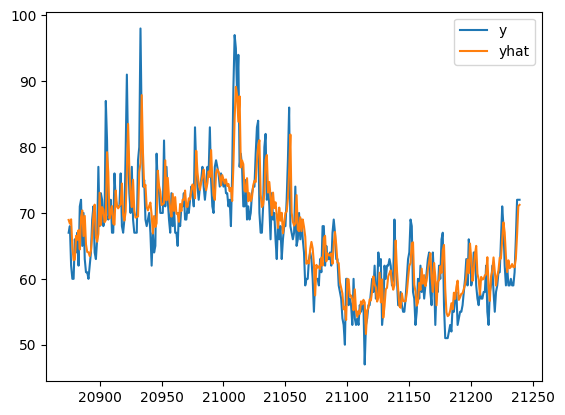

In [50]:
cv[["y", "yhat"]][-365:].plot()


# Predict next day with higher accuracy

In [51]:
m = fit_prophet(weather)
m.predict(weather.iloc[-1:])

00:12:07 - cmdstanpy - INFO - Chain [1] start processing
00:12:16 - cmdstanpy - INFO - Chain [1] done processing


,ds,trend,yhat_lower,yhat_upper,trend_lower,trend_upper,additive_terms,additive_terms_lower,additive_terms_upper,extra_regressors_additive,...,weekly,weekly_lower,weekly_upper,yearly,yearly_lower,yearly_upper,multiplicative_terms,multiplicative_terms_lower,multiplicative_terms_upper,yhat
0,2023-04-22,66.321279,65.253916,77.200839,66.321279,66.321279,4.820439,4.820439,4.820439,4.769445,...,0.091557,0.091557,0.091557,-0.040564,-0.040564,-0.040564,0.0,0.0,0.0,71.141718


# Predict for next year 

In [52]:
m = Prophet()
m.fit(weather)
future = m.make_future_dataframe(periods=365)
forecast = m.predict(future)

00:12:17 - cmdstanpy - INFO - Chain [1] start processing
00:12:28 - cmdstanpy - INFO - Chain [1] done processing


In [53]:
from prophet.plot import plot_plotly

plot_plotly(m, forecast)